In [1]:
%pylab inline
import numpy as np
from astropy.io import fits
from numpy.lib.recfunctions import append_fields
from astropy.coordinates import SkyCoord
from astropy.time import Time
import astropy.units as u
from galpy.orbit import Orbit
from galpy.potential import MWPotential2014, DehnenBarPotential, plotPotentials, plotDensities
import time
import healpy as hp
from plotting import plot_hrd, plot_mollweide, plot_encounter, plot_lma_vs_orbit, plot_comparison_orbit, plot_mollweide_log
from utility import grvs_for_blue_sources, grvs_for_red_sources, compute_ruwe, linear_motion_approximation, sample_gaia_uncertainty, linear_motion_approximation_split_input, orbit_distance, sample_gaia_uncertainty_5d, hpx_prior_rvs, hpx_density, hpx_statistic, gaia_hpx_factor, number_of_healpixels

Populating the interactive namespace from numpy and matplotlib


In [2]:
# We also load the same query for the GDR2mock catalogue.
# Since all radial velocities are known in GDR2mock we will get many more stars
y = np.load('/home/oastolk/Galaxia_wrap/output/mock_cat/GDR3mock_sample10_500pc.npy')
print(len(y),y.dtype)


3675631 [('rad', '<f8'), ('teff', '<f8'), ('vx', '<f8'), ('vy', '<f8'), ('vz', '<f8'), ('pz', '<f8'), ('px', '<f8'), ('py', '<f8'), ('feh', '<f8'), ('exbv_schlegel', '<f8'), ('lum', '<f8'), ('glon', '<f8'), ('glat', '<f8'), ('smass', '<f8'), ('age', '<f8'), ('grav', '<f8'), ('gaia_g', '<f8'), ('gaia_bpft', '<f8'), ('gaia_bpbr', '<f8'), ('gaia_rp', '<f8'), ('gaia_rvs', '<f8'), ('popid', '<i4'), ('mact', '<f8'), ('lma_min_distance', '<f8'), ('total_velocity', '<f8'), ('lma_min_time', '<f8'), ('orbit_min_distance', '<f8'), ('orbit_min_time', '<f8'), ('parallax', '<f8'), ('pmra', '<f8'), ('pmdec', '<f8'), ('radial_velocity', '<f8'), ('ra', '<f8'), ('dec', '<f8')]


In [2]:
def LMA_oscar(x):
    """
    Calculates from parallax, pmra, pmdec, radial_velocity via linear motion approximation the
        closest distance in pc
        total velocity in km/s
        time of closest approach in Myr
    """
    v_T = np.sqrt(x['pmra']**2 + x['pmdec']**2) * np.divide(4.74047,x['parallax'])
    total_velocity = np.sqrt(v_T**2 + x['radial_velocity']**2)
    closest_distance = np.divide(1000*v_T,x['parallax']*total_velocity)
    closest_time = np.divide(-0.97779e9,x['parallax']) * np.divide(x['radial_velocity'],total_velocity**2)
    return(closest_distance, total_velocity, np.divide(closest_time,1e6))

In [4]:
# Here we calculate their closest approach, time of perihelion and their speed according to the linear motion approximation
# obs. data: x.lma_min_distance, x.total_velocity, x.lma_min_time = linear_motion_approximation(x)
#linear_motion_approximation??
y['lma_min_distance'], y['total_velocity'], y['lma_min_time'] = LMA_oscar(y)

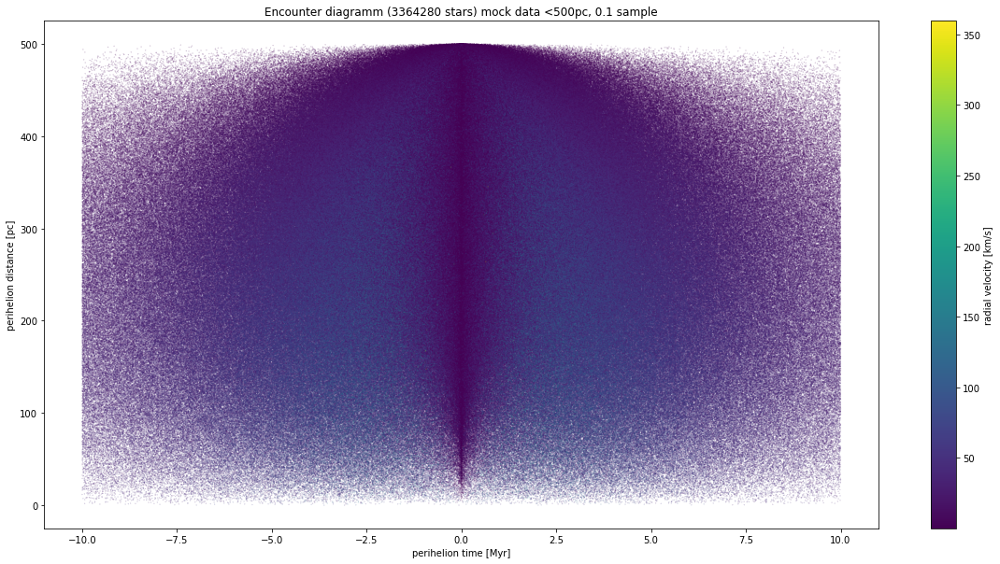

In [6]:
import matplotlib.pyplot as plt

maxtime = 10 #Myr
maxdist = 1000 #pc
pltdat1 = y[(np.abs(y['lma_min_time'])<maxtime) & (y['lma_min_distance']<maxdist)]

plt.figure(figsize = (20,10))
ax = plt.subplot(111)
im = ax.scatter(pltdat1['lma_min_time'],pltdat1['lma_min_distance'],alpha = 1,s = 0.01,c = np.abs(pltdat1['radial_velocity']))
plt.colorbar(im, label = 'radial velocity [km/s]')
plt.ylabel("perihelion distance [pc]")
plt.xlabel("perihelion time [Myr]")
#plt.xlim(xlim)
#plt.ylim(ylim)
plt.title("Encounter diagramm ({} stars) {}".format(len(pltdat1),'mock data <500pc, 0.1 sample'))
plt.savefig('enc-diag_10samp_500pc10myr')
plt.show()

In [7]:
y['smass']

array([0.09539148, 0.4249326 , 0.13277759, ..., 0.88680285, 0.11046323,
       0.6315729 ])

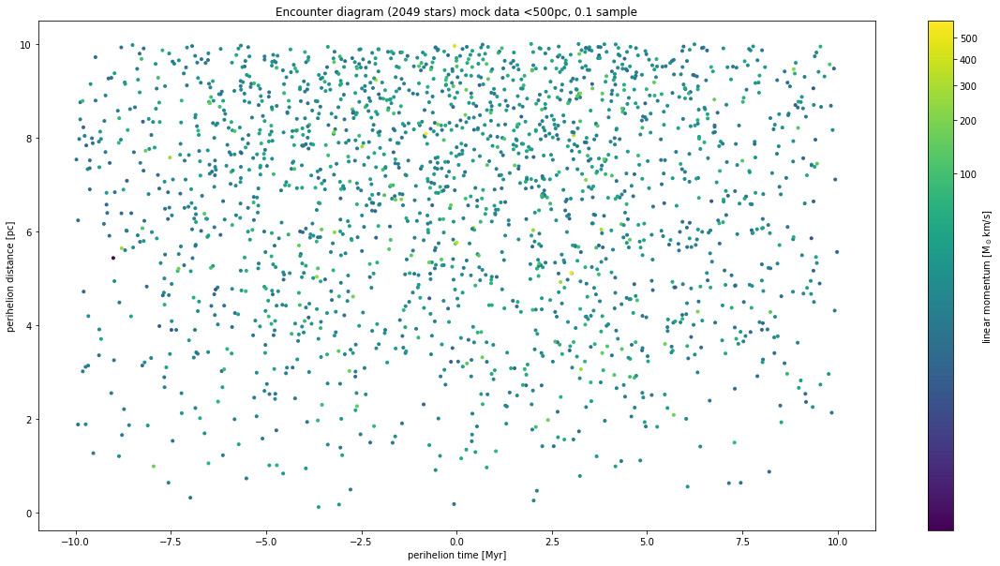

In [6]:
import matplotlib.colors

maxtime = 10 #Myr
maxdist = 10 #pc
pltdat2 = y[(np.abs(y['lma_min_time'])<maxtime) & (y['lma_min_distance']<maxdist)]

plt.figure(figsize = (20,10))
ax = plt.subplot(111)
im = ax.scatter(pltdat2['lma_min_time'],pltdat2['lma_min_distance'],alpha = 1,s = 9,
                c = np.abs(pltdat2['total_velocity']*pltdat2['smass']), norm=matplotlib.colors.PowerNorm(0.2))
plt.colorbar(im, label = 'linear momentum [M$_\odot$km/s]')
plt.ylabel("perihelion distance [pc]")
plt.xlabel("perihelion time [Myr]")
#plt.xlim(xlim)
#plt.ylim(ylim)
plt.title("Encounter diagram ({} stars) {}".format(len(pltdat2),'mock data <500pc, 0.1 sample'))
plt.savefig('enc-diag_10samp_10pc10myr')
plt.show()

In [8]:
# filter sample on photometry
# from https://arxiv.org/pdf/2009.12112.pdf , a rough guesstimation: VIS < 24.5 mag, NIR < 23.5 mag
# gaia only has visual instruments. for now, I'll use gaia G as euclid VIS

filt_phot = (pltdat2['gaia_g'] < 24.5)
samp_phot = pltdat2[filt_phot]
print(len(pltdat2))
print(len(samp_phot))
print(max(pltdat2['gaia_g']))
print(max(y['gaia_g']))

2049
2049
24.270927977583415
24.79351958610101


In [9]:
"""# filter sample on spectroscopy. 
# I didn't find spectrocopic limits for Euclid yet, so I'll use gaia limits, but less strict

filt_spec = (pltdat2['gaia_rvs'] < 18) & (pltdat2['teff'] < 6.900) & (pltdat2['teff'] > 2.000)
samp_spec = pltdat2[filt_phot & filt_spec]
print(len(samp_spec))
"""

1483


In [12]:
# filter sample on proper motion. only sources with small proper motion are relevant for encounters
# multiply by radial distance, proper motion is more relevant for distant stars.

filt_pm = (np.sqrt(pltdat2['pmra']**2 + pltdat2['pmdec']**2) < 10)
samp_pm = pltdat2[filt_phot & filt_pm]
print(len(samp_pm))


1622


In [17]:
euc_phot = (y['gaia_g'] < 24.5)
euc_pm = (np.sqrt(y['pmra']**2 + y['pmdec']**2) < 10)
euc_dph = (y['lma_min_distance'] < 10) & (np.abs(y['lma_min_time']) < 15)
euclid_phot_pm = y[euc_phot & euc_pm]
euclid_phot_pm_dph = y[euc_phot & euc_pm & euc_dph]
print(len(y))
print(len(euclid_phot_pm))
print(len(euclid_phot_pm_dph))

3675631
534564
1904


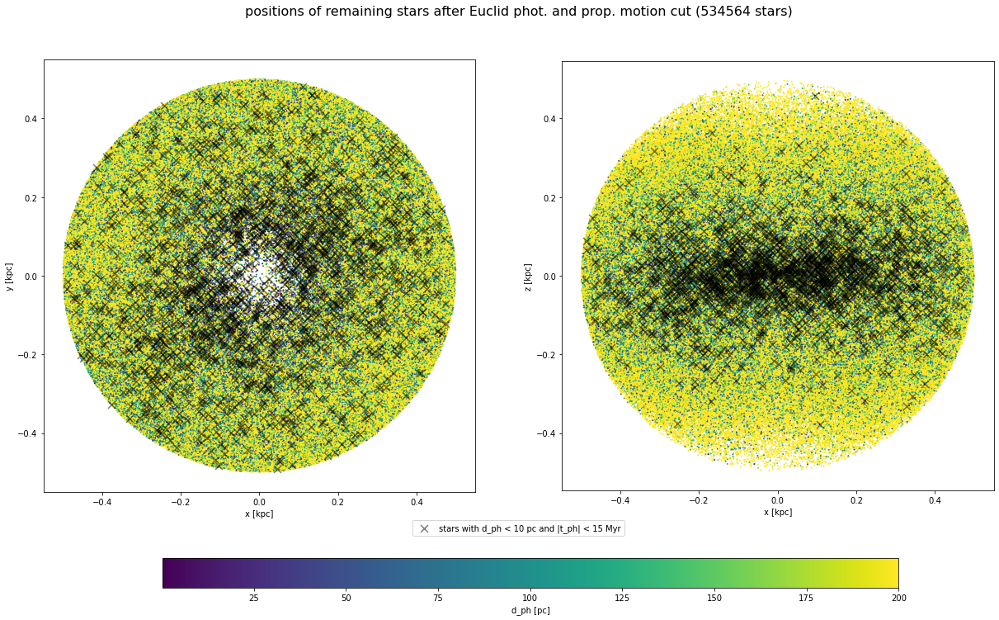

In [61]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

xlim = [15,15]
ylim = [0,10]

fig, ax = plt.subplots(1,2,figsize=(16,10))
#fig.tight_layout()

axpos = []
for idx, coord in enumerate(['py', 'pz']):
    im = ax[idx].scatter(euclid_phot_pm['px'],euclid_phot_pm[coord],alpha = 1,s = 1,
                    c = np.abs(euclid_phot_pm['lma_min_distance']), vmax=200)#, norm=matplotlib.colors.PowerNorm(0.2))
    dph = ax[idx].scatter(euclid_phot_pm_dph['px'],euclid_phot_pm_dph[coord], marker='x',
                      color='black', alpha=0.5, s=80, label='stars with d_ph < 10 pc and |t_ph| < 15 Myr')
    ax[idx].set_ylabel(f"{'y' if coord == 'py' else 'z'} [kpc]")
    ax[idx].set_xlabel("x [kpc]")
    ax[idx].set(aspect='equal')
    axpos.append(ax[idx].get_position().get_points().flatten())

ax_cbar = fig.add_axes([axpos[0][0], 0, axpos[1][2]-axpos[0][0], 0.05])
plt.colorbar(im, cax=ax_cbar, orientation='horizontal', label = 'd_ph [pc]')
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center', bbox_to_anchor=(0.5,0.1))
fig.suptitle("positions of remaining stars after Euclid phot. and prop. motion cut ({} stars)".format(len(euclid_phot_pm)),
            fontsize=16)
fig.subplots_adjust(0,.15,1,.9)
#plt.savefig('enc-diag_10samp_10pc10myr_phot-pm-cut')
plt.show()

In [65]:
euc_dph1 = (y['lma_min_distance'] < 3) & (y['lma_min_time'] < 15)
euclid_phot_pm_dph1 = y[euc_phot & euc_pm & euc_dph1]
print(len(euclid_phot_pm_dph1))

167


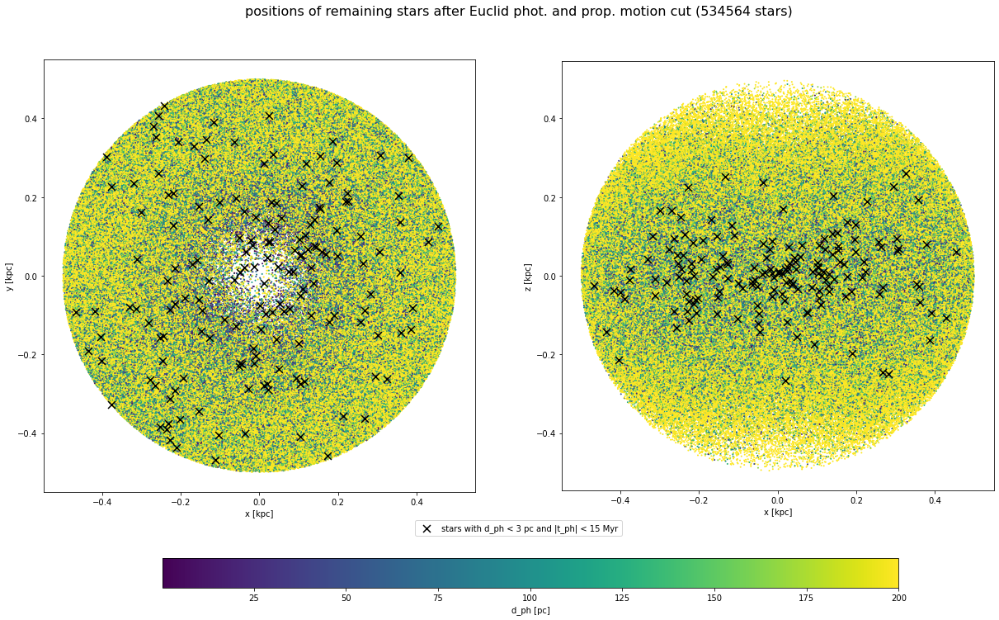

In [67]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

xlim = [15,15]
ylim = [0,10]

fig, ax = plt.subplots(1,2,figsize=(16,10))
#fig.tight_layout()

axpos = []
for idx, coord in enumerate(['py', 'pz']):
    im = ax[idx].scatter(euclid_phot_pm['px'],euclid_phot_pm[coord],alpha = 1,s = 1,
                    c = np.abs(euclid_phot_pm['lma_min_distance']), vmax=200)#, norm=matplotlib.colors.PowerNorm(0.2))
    dph = ax[idx].scatter(euclid_phot_pm_dph1['px'],euclid_phot_pm_dph1[coord], marker='x',
                      color='black', alpha=1, s=80, label='stars with d_ph < 3 pc and |t_ph| < 15 Myr')
    ax[idx].set_ylabel(f"{'y' if coord == 'py' else 'z'} [kpc]")
    ax[idx].set_xlabel("x [kpc]")
    ax[idx].set(aspect='equal')
    axpos.append(ax[idx].get_position().get_points().flatten())

ax_cbar = fig.add_axes([axpos[0][0], 0, axpos[1][2]-axpos[0][0], 0.05])
plt.colorbar(im, cax=ax_cbar, orientation='horizontal', label = 'd_ph [pc]')
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center', bbox_to_anchor=(0.5,0.1))
fig.suptitle("positions of remaining stars after Euclid phot. and prop. motion cut ({} stars)".format(len(euclid_phot_pm)),
            fontsize=16)
fig.subplots_adjust(0,.15,1,.9)
#plt.savefig('enc-diag_10samp_10pc10myr_phot-pm-cut')
plt.show()

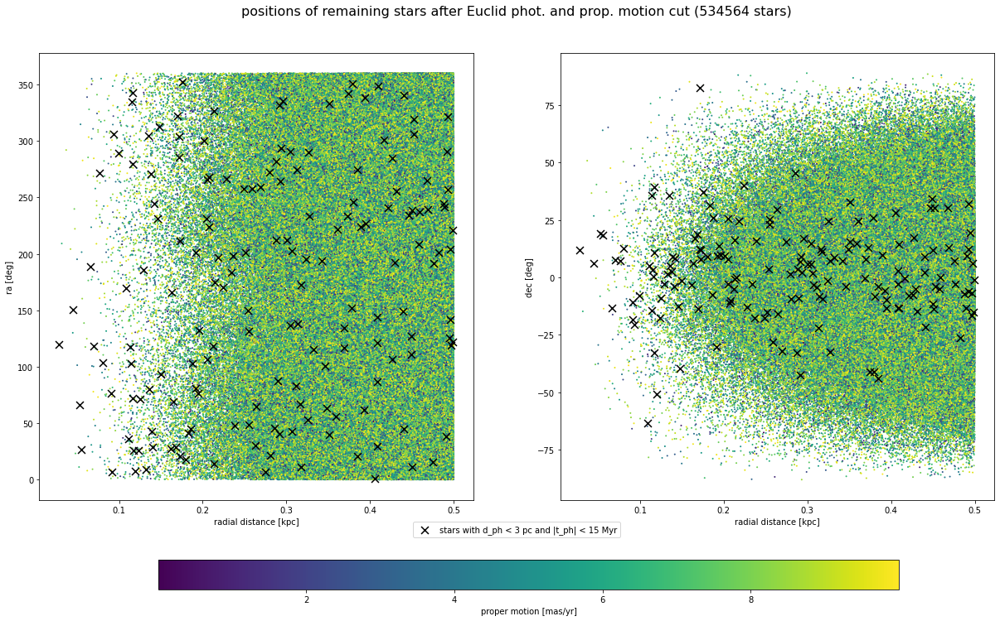

In [70]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

xlim = [15,15]
ylim = [0,10]

fig, ax = plt.subplots(1,2,figsize=(16,10))
#fig.tight_layout()

axpos = []
for idx, coord in enumerate(['ra', 'dec']):
    im = ax[idx].scatter(euclid_phot_pm['rad'],euclid_phot_pm[coord],alpha = 1,s = 1,
                    c = np.sqrt(euclid_phot_pm['pmra']**2 + euclid_phot_pm['pmdec']**2))#, norm=matplotlib.colors.PowerNorm(0.2))
    dph = ax[idx].scatter(euclid_phot_pm_dph1['rad'],euclid_phot_pm_dph1[coord], marker='x',
                      color='black', alpha=1, s=80, label='stars with d_ph < 3 pc and |t_ph| < 15 Myr')
    ax[idx].set_ylabel(f"{coord} [deg]")
    ax[idx].set_xlabel("radial distance [kpc]")
    #ax[idx].set(aspect='equal')
    axpos.append(ax[idx].get_position().get_points().flatten())

ax_cbar = fig.add_axes([axpos[0][0], 0, axpos[1][2]-axpos[0][0], 0.05])
plt.colorbar(im, cax=ax_cbar, orientation='horizontal', label = 'proper motion [mas/yr]')
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center', bbox_to_anchor=(0.5,0.1))
fig.suptitle("positions of remaining stars after Euclid phot. and prop. motion cut ({} stars)".format(len(euclid_phot_pm)),
            fontsize=16)
fig.subplots_adjust(0,.15,1,.9)
#plt.savefig('enc-diag_10samp_10pc10myr_phot-pm-cut')
plt.show()

In [9]:
def propmotion(data):
    return np.sqrt(data['pmra']**2 + data['pmdec']**2)

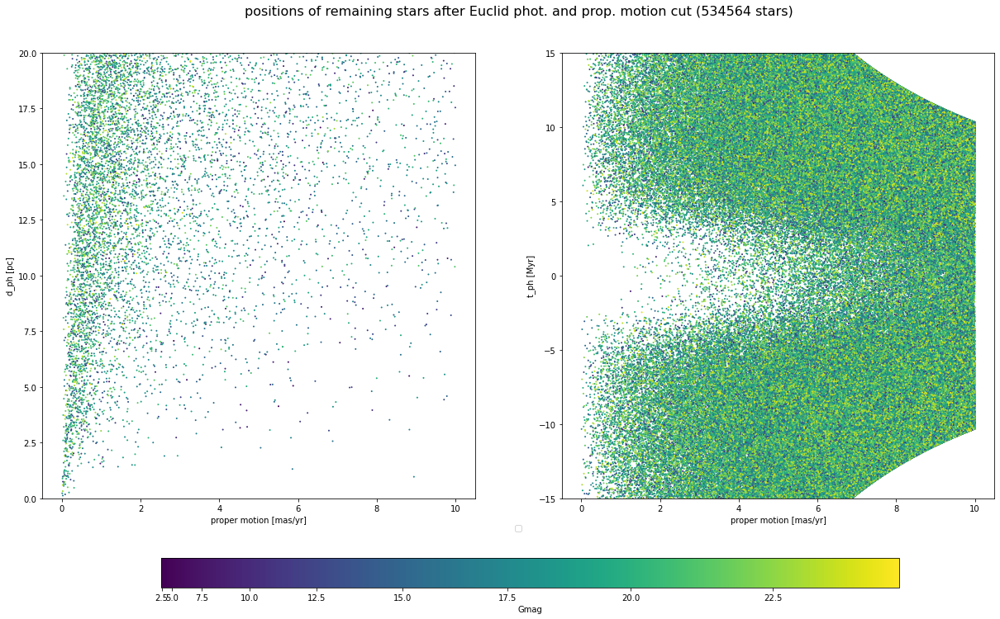

In [181]:

fig, ax = plt.subplots(1,2,figsize=(16,10))
#fig.tight_layout()

axpos = []
for idx, coord in enumerate(['lma_min_distance', 'lma_min_time']):
    im1 = ax[idx].scatter(propmotion(euclid_phot_pm),euclid_phot_pm[coord],alpha = 1,s = 1,
                    c = euclid_phot_pm['gaia_g'], norm=matplotlib.colors.PowerNorm(2))
    #im2 = ax[idx].scatter(propmotion(euclid_phot_pm_dph1),euclid_phot_pm_dph1[coord], marker='x',
    #                  color='black', alpha=1, s=80, label='stars with d_ph < 3 pc and |t_ph| < 15 Myr')
    ax[idx].set_ylabel("d_ph [pc]" if idx == 0 else "t_ph [Myr]")
    ax[idx].set_xlabel("proper motion [mas/yr]")
    #ax[idx].set(aspect='equal')
    axpos.append(ax[idx].get_position().get_points().flatten())
ax[0].set_ylim([0,20])
ax[1].set_ylim([-15,15])

ax_cbar = fig.add_axes([axpos[0][0], 0, axpos[1][2]-axpos[0][0], 0.05])
plt.colorbar(im1, cax=ax_cbar, orientation='horizontal', label = 'Gmag')
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center', bbox_to_anchor=(0.5,0.1))
fig.suptitle("positions of remaining stars after Euclid phot. and prop. motion cut ({} stars)".format(len(euclid_phot_pm)),
            fontsize=16)
fig.subplots_adjust(0,.15,1,.9)
#plt.savefig('enc-diag_10samp_10pc10myr_phot-pm-cut')
plt.show()

In [10]:
def div(a, b):
    d = []
    for idx, el in enumerate(a):
        if b[idx] == 0:
            d.append(0.0)
        elif a[idx] == 0:
            d.append(0.0)
        else:
            d.append(np.divide(a[idx],b[idx]))
    return d

['observations', 'encounters']


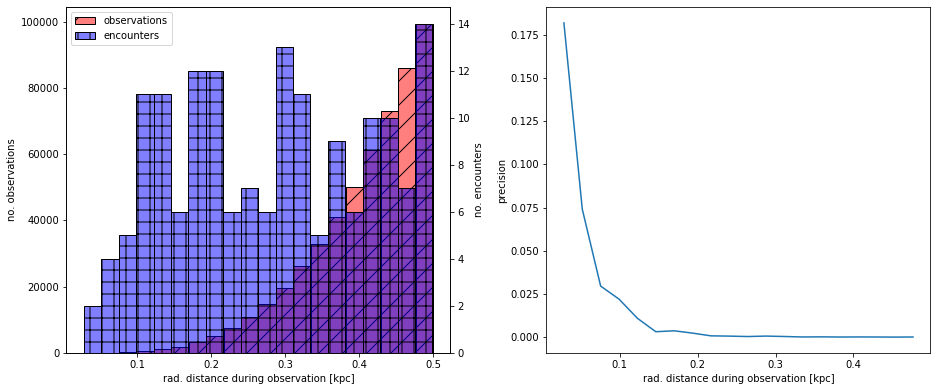

In [172]:
import seaborn as sns

fig, ax = plt.subplots(1,2,figsize=(12,8))

nbins = 20
        
hist1 = sns.histplot(euclid_phot_pm['rad'], bins=nbins, alpha=0.5, ax=ax[0],
                     color='red', hatch='/', label='observations')
ax[0].set_ylabel('no. observations')
ax[0].set_xlabel('rad. distance during observation [kpc]')
ax2 = ax[0].twinx()
hist2 = sns.histplot(euclid_phot_pm_dph1['rad'], bins=nbins, alpha=0.5, ax=ax2,
                     color='blue', hatch='+', label='encounters')
ax2.set_ylabel('no. observed encounters')
handles, labels = ax[0].get_legend_handles_labels()
h, l = ax2.get_legend_handles_labels()
handles.extend(h)
labels.extend(l)
ax[0].legend(handles, labels)

obs_n, obs_edges = np.histogram(euclid_phot_pm['rad'], nbins)
enc_n, enc_edges = np.histogram(euclid_phot_pm_dph1['rad'], nbins)
histdat = div(enc_n,obs_n)
dens = ax[1].plot(obs_edges[:-1],histdat)
ax[1].set_ylabel('precision (no. observed encounters / no. observations)')
ax[1].set_xlabel('rad. distance during observation [kpc]')
#fig.suptitle("positions of remaining stars after Euclid phot. and prop. motion cut ({} stars)".format(len(euclid_phot_pm)),
#            fontsize=16)
fig.subplots_adjust(0,.2,1,.8,0.25,0)
#plt.savefig('enc-diag_10samp_10pc10myr_phot-pm-cut')
plt.show()

In [74]:
# precision: how many stars that pass the Euclid cuts are close encounters?
# recall: how many of close encounters pass the Euclid cuts?

print('number of Euclid cut remainders (<24.5 Gmag, <10 mas/yr): ', len(euclid_phot_pm))
print('number of Euclid cut remainders that are close encounters (<3pc, <15Myr): ',len(euclid_phot_pm_dph1))
print('fraction (precision): ', len(euclid_phot_pm_dph1)/len(euclid_phot_pm))
print('number of close encounters: ', len(y[euc_dph1]))
print('number of close encounters that pass Euclid cut: ', len(euclid_phot_pm_dph1))
print('fraction (recall): ', len(euclid_phot_pm_dph1)/len(y[euc_dph1]))
print(f'true positive: {len(euclid_phot_pm_dph1)}, true negative: {len(y)-len(euclid_phot_pm)}, total sample: {len(y)}')
print('accuracy: ', (len(euclid_phot_pm_dph1)+len(y)-len(euclid_phot_pm))/len(y))

number of Euclid cut remainders (<24.5 Gmag, <10 mas/yr):  534564
number of Euclid cut remainders that are close encounters (<3pc, <15Myr):  167
fraction (precision):  0.0003124041274758495
number of close encounters:  188
number of close encounters that pass Euclid cut:  167
fraction (recall):  0.8882978723404256
true positive: 167, true negative: 3141067, total sample: 3675631
accuracy:  0.8546108137623173


In [76]:
# now we do the same for another mock sample, with larger initial distance:
y2 = np.load('/home/oastolk/Galaxia_wrap/output/mock_cat/GAIADR3mock_sample100_3kpc.npy')
# filename not accurate, it is 0.001 sample, not 0.01
print(len(y2),y2.dtype)

1521558 [('rad', '<f8'), ('teff', '<f8'), ('vx', '<f8'), ('vy', '<f8'), ('vz', '<f8'), ('pz', '<f8'), ('px', '<f8'), ('py', '<f8'), ('feh', '<f8'), ('exbv_schlegel', '<f8'), ('lum', '<f8'), ('glon', '<f8'), ('glat', '<f8'), ('smass', '<f8'), ('age', '<f8'), ('grav', '<f8'), ('gaia_g', '<f8'), ('gaia_bpft', '<f8'), ('gaia_bpbr', '<f8'), ('gaia_rp', '<f8'), ('gaia_rvs', '<f8'), ('sloan_u', '<f8'), ('sloan_g', '<f8'), ('sloan_r', '<f8'), ('sloan_i', '<f8'), ('sloan_z', '<f8'), ('popid', '<i4'), ('mact', '<f8'), ('lma_min_distance', '<f8'), ('total_velocity', '<f8'), ('lma_min_time', '<f8'), ('orbit_min_distance', '<f8'), ('orbit_min_time', '<f8'), ('parallax', '<f8'), ('pmra', '<f8'), ('pmdec', '<f8'), ('radial_velocity', '<f8'), ('ra', '<f8'), ('dec', '<f8')]


In [77]:
y2['lma_min_distance'], y2['total_velocity'], y2['lma_min_time'] = LMA_oscar(y2)

In [84]:
euc_phot2 = (y2['gaia_g'] < 24.5) | (y2['sloan_g'] < 24.5) | (y2['sloan_r'] < 24.0)
euc_pm2 = (np.sqrt(y2['pmra']**2 + y2['pmdec']**2) < 10)
euc_dph2 = (y2['lma_min_distance'] < 10) & (np.abs(y2['lma_min_time']) < 15)
euclid_phot_pm2 = y2[euc_phot2 & euc_pm2]
euclid_phot_pm_dph2 = y2[euc_phot2 & euc_pm2 & euc_dph2]

print('number of Euclid cut remainders (<24.5 Gmag or <24.5 SDSSg or <24.0 SDSSr, <10 mas/yr): ', len(euclid_phot_pm2))
print('number of Euclid cut remainders that are close encounters (<10pc, <15Myr): ',len(euclid_phot_pm_dph2))
print('fraction (precision): ', len(euclid_phot_pm_dph2)/len(euclid_phot_pm2))
print('number of close encounters: ', len(y2[euc_dph2]))
print('number of close encounters that pass Euclid cut: ', len(euclid_phot_pm_dph2))
print('fraction (recall): ', len(euclid_phot_pm_dph2)/len(y2[euc_dph2]))
print(f'true positive: {len(euclid_phot_pm_dph2)}, true negative: {len(y2)-len(euclid_phot_pm2)}, total sample: {len(y2)}')
print('accuracy: ', (len(euclid_phot_pm_dph2)+len(y2)-len(euclid_phot_pm2))/len(y2))

number of Euclid cut remainders (<24.5 Gmag, <10 mas/yr):  1223912
number of Euclid cut remainders that are close encounters (<10pc, <15Myr):  32
fraction (precision):  2.6145670603768897e-05
number of close encounters:  37
number of close encounters that pass Euclid cut:  32
fraction (recall):  0.8648648648648649
true positive: 32, true negative: 297646, total sample: 1521558
accuracy:  0.19564025820901995


In [8]:
# load Euclid and SDSS mock sample
y3 = np.load('/home/oastolk/Galaxia_wrap/output/mock_cat/EUCLID_SDSS_mock_sample1000_3kpc.npy')

print(len(y3),y3.dtype)

2028426 [('rad', '<f8'), ('teff', '<f8'), ('vx', '<f8'), ('vy', '<f8'), ('vz', '<f8'), ('pz', '<f8'), ('px', '<f8'), ('py', '<f8'), ('feh', '<f8'), ('exbv_schlegel', '<f8'), ('lum', '<f8'), ('glon', '<f8'), ('glat', '<f8'), ('smass', '<f8'), ('age', '<f8'), ('grav', '<f8'), ('euclid_v', '<f8'), ('euclid_y', '<f8'), ('euclid_b', '<f8'), ('euclid_j', '<f8'), ('euclid_r', '<f8'), ('euclid_h', '<f8'), ('sloan_u', '<f8'), ('sloan_g', '<f8'), ('sloan_r', '<f8'), ('sloan_i', '<f8'), ('sloan_z', '<f8'), ('popid', '<i4'), ('mact', '<f8'), ('lma_min_distance', '<f8'), ('total_velocity', '<f8'), ('lma_min_time', '<f8'), ('orbit_min_distance', '<f8'), ('orbit_min_time', '<f8'), ('parallax', '<f8'), ('pmra', '<f8'), ('pmdec', '<f8'), ('radial_velocity', '<f8'), ('ra', '<f8'), ('dec', '<f8')]


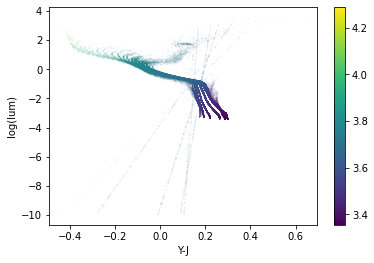

In [24]:
# check stars in HR diagram


plt.scatter(y3['euclid_y'][::10]-y3['euclid_j'][::10], y3['lum'][::10],s=0.001,c=y3['teff'][::10])
plt.colorbar()
plt.ylabel('log(lum)')
plt.xlabel('Y-J')
#plt.savefig('hrdiag_check_euclid-sdss-samp1000')
plt.show()

In [4]:
# apply LMA

y3['lma_min_distance'], y3['total_velocity'], y3['lma_min_time'] = LMA_oscar(y3)

In [5]:
# apply observational cuts to data. mag limits (10sigma) from table 1 in https://arxiv.org/pdf/2009.12112.pdf 
# g < 24.20; r < 23.85; i < 22.96; z < 22.45; Y < 23.81; J < 23.59; H < 23.13; VIS < 24.50

ph_cut = (y3['sloan_g'] < 24.2) | (y3['sloan_r'] < 23.85) | (y3['sloan_i'] < 22.96) | (y3['sloan_z'] < 22.45) | \
(y3['euclid_y'] < 23.81) | (y3['euclid_j'] < 23.59) | (y3['euclid_h'] < 23.13) | (y3['euclid_v'] < 24.5)

obs_euc = y3[ph_cut]

print(len(y3))
print(len(obs_euc))

2028426
1939872


In [6]:
# apply proper motion cut, < 10 mas/yr

pm_cut = (np.sqrt(obs_euc['pmra']**2 + obs_euc['pmdec']**2) < 10)

pm_obs = obs_euc[pm_cut]

print(len(pm_obs))


1605204


In [10]:
# apply close encounter cut 

def ce_cut(dph, tph, data):
    return data[(data['lma_min_distance'] < dph) & (np.abs(data['lma_min_time']) < tph)]

dph = 33 #pc
tph = 15 #Myr

ce = ce_cut(dph, tph, y3)
obs_ce = ce_cut(dph, tph, obs_euc)
obs_pm_ce = ce_cut(dph, tph, pm_obs)


In [11]:

def stats(dat, ce, obs_pm, obs_ce, obs_pm_ce):
    print('phot. cut: g < 24.20; r < 23.85; i < 22.96; z < 22.45; Y < 23.81; J < 23.59; H < 23.13; VIS < 24.50')
    print('number of Euclid phot. and prop motion cut remainders: ', len(obs_pm))
    print('number of Euclid cut remainders that are close encounters (<33pc, <15Myr): ',len(obs_pm_ce))
    print('fraction (precision): ', len(obs_pm_ce)/len(obs_pm))
    print('number of close encounters: ', len(ce))
    print('number of close encounters that pass Euclid cut: ', len(obs_pm_ce))
    print('fraction (recall): ', len(obs_pm_ce)/len(ce))
    print(f'true positive: {len(obs_pm_ce)}, true negative: {len(dat)-len(obs_pm)}, total sample: {len(dat)}')
    print('accuracy: ', (len(obs_pm_ce)+len(dat)-len(obs_pm))/len(dat))
    return

In [12]:
stats(y3,ce,pm_obs,obs_ce,obs_pm_ce)

phot. cut: g < 24.20; r < 23.85; i < 22.96; z < 22.45; Y < 23.81; J < 23.59; H < 23.13; VIS < 24.50
number of Euclid phot. and prop motion cut remainders:  1605204
number of Euclid cut remainders that are close encounters (<33pc, <15Myr):  299
fraction (precision):  0.00018626915955853587
number of close encounters:  376
number of close encounters that pass Euclid cut:  299
fraction (recall):  0.7952127659574468
true positive: 299, true negative: 423222, total sample: 2028426
accuracy:  0.20879292614076136


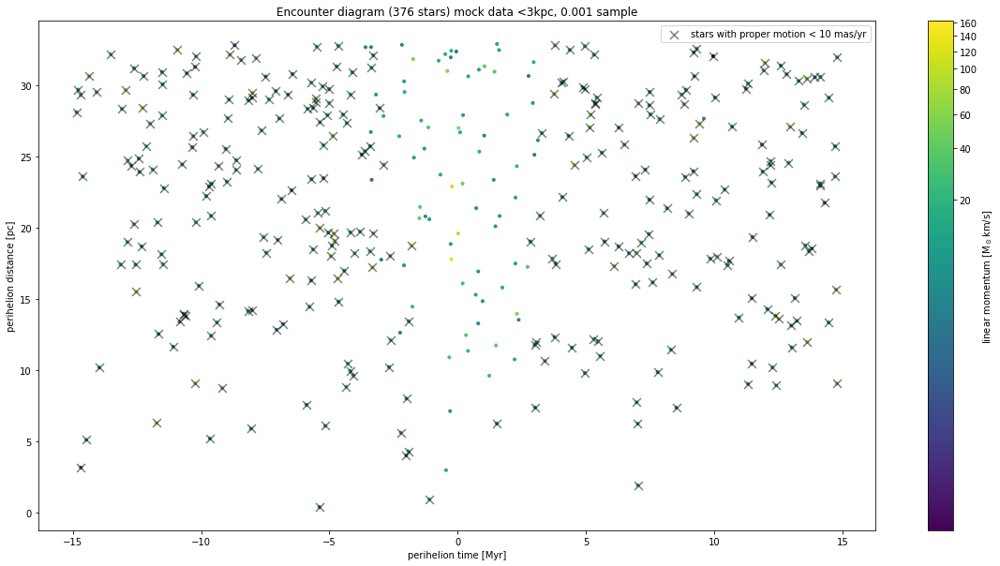

In [9]:
import matplotlib.colors

plt.figure(figsize = (20,10))
ax = plt.subplot(111)
ce_plt = ax.scatter(ce['lma_min_time'],ce['lma_min_distance'],alpha = 1,s = 9,
                c = np.abs(ce['total_velocity']*ce['smass']), norm=matplotlib.colors.PowerNorm(0.2))
pm_plt = ax.scatter(obs_pm_ce['lma_min_time'],obs_pm_ce['lma_min_distance'], marker='x',
                      color='black', alpha=0.5, s=80, label='stars with proper motion < 10 mas/yr')
plt.colorbar(ce_plt, label = 'linear momentum [M$_\odot$km/s]')
plt.ylabel("perihelion distance [pc]")
plt.xlabel("perihelion time [Myr]")
plt.legend()
plt.title("Encounter diagram ({} stars) {}".format(len(ce),'mock data <3kpc, 0.001 sample'))
fig.savefig('enc-diag_1000samp_33pc15myr')
plt.show()

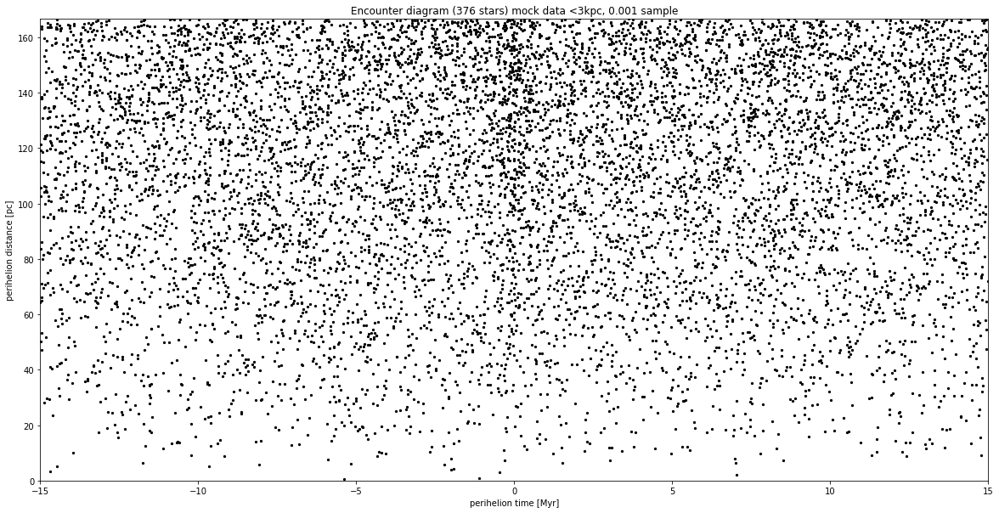

In [13]:
# this should resemble fig.9 from bailer-jones 2018

pltdat = ce_cut(166.67,15,y3)

plt_dph, plt_vel, plt_tph = LMA_oscar(pltdat)

plt.figure(figsize = (20,10))
ax = plt.subplot(111)
ce_plt = ax.scatter(plt_tph,plt_dph,alpha = 1,s = 5,color='black')
#plt.colorbar(ce_plt, label = 'linear momentum [M$_\odot$km/s]')
plt.ylabel("perihelion distance [pc]")
plt.xlabel("perihelion time [Myr]")
plt.xlim([-15,15])
plt.ylim([0,166.67])
plt.title("Encounter diagram ({} stars) {}".format(len(ce),'mock data <3kpc, 0.001 sample'))
plt.savefig('enc-diag_1000samp_167pc15myr')
plt.show()

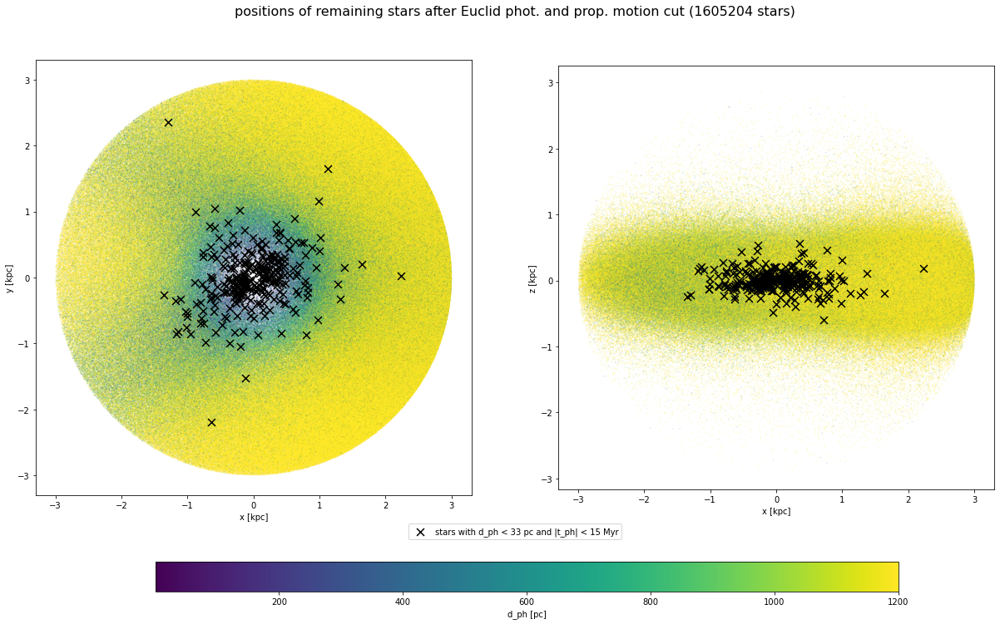

In [8]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(1,2,figsize=(16,10))

axpos = []
for idx, coord in enumerate(['py', 'pz']):
    obs_plt = ax[idx].scatter(pm_obs['px'],pm_obs[coord],alpha = 1,s = 0.01,
                    c = np.abs(pm_obs['lma_min_distance']), vmax=1200)#, norm=matplotlib.colors.PowerNorm(0.2))
    ce_plt = ax[idx].scatter(obs_pm_ce['px'],obs_pm_ce[coord], marker='x',
                      color='black', alpha=1, s=80, label='stars with d_ph < 33 pc and |t_ph| < 15 Myr')
    ax[idx].set_ylabel(f"{'y' if coord == 'py' else 'z'} [kpc]")
    ax[idx].set_xlabel("x [kpc]")
    ax[idx].set(aspect='equal')
    axpos.append(ax[idx].get_position().get_points().flatten())

ax_cbar = fig.add_axes([axpos[0][0], 0, axpos[1][2]-axpos[0][0], 0.05])
plt.colorbar(obs_plt, cax=ax_cbar, orientation='horizontal', label = 'd_ph [pc]')
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center', bbox_to_anchor=(0.5,0.1))
fig.suptitle("positions of remaining stars after Euclid phot. and prop. motion cut ({} stars)".format(len(pm_obs)),
            fontsize=16)
fig.subplots_adjust(0,.15,1,.9)
plt.savefig('positions_samp1000_33pc15myr_phot-pm-cut')
plt.show()

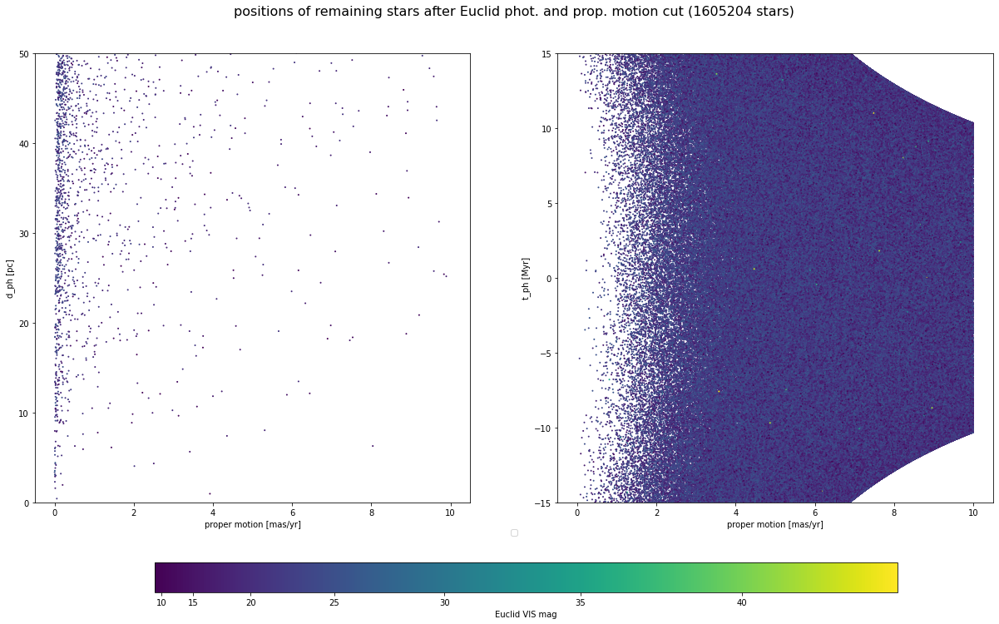

In [14]:

fig, ax = plt.subplots(1,2,figsize=(16,10))
#fig.tight_layout()

axpos = []
for idx, coord in enumerate(['lma_min_distance', 'lma_min_time']):
    im1 = ax[idx].scatter(propmotion(pm_obs),pm_obs[coord],alpha = 1,s = 1,
                    c = pm_obs['euclid_v'], norm=matplotlib.colors.PowerNorm(2))
    #im2 = ax[idx].scatter(propmotion(euclid_phot_pm_dph1),euclid_phot_pm_dph1[coord], marker='x',
    #                  color='black', alpha=1, s=80, label='stars with d_ph < 3 pc and |t_ph| < 15 Myr')
    ax[idx].set_ylabel("d_ph [pc]" if idx == 0 else "t_ph [Myr]")
    ax[idx].set_xlabel("proper motion [mas/yr]")
    #ax[idx].set(aspect='equal')
    axpos.append(ax[idx].get_position().get_points().flatten())
ax[0].set_ylim([0,50])
ax[1].set_ylim([-15,15])

ax_cbar = fig.add_axes([axpos[0][0], 0, axpos[1][2]-axpos[0][0], 0.05])
plt.colorbar(im1, cax=ax_cbar, orientation='horizontal', label = 'Euclid VIS mag')
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center', bbox_to_anchor=(0.5,0.1))
fig.suptitle("positions of remaining stars after Euclid phot. and prop. motion cut ({} stars)".format(len(pm_obs)),
            fontsize=16)
fig.subplots_adjust(0,.15,1,.9)
plt.savefig('pm-dph_samp1000')
plt.show()

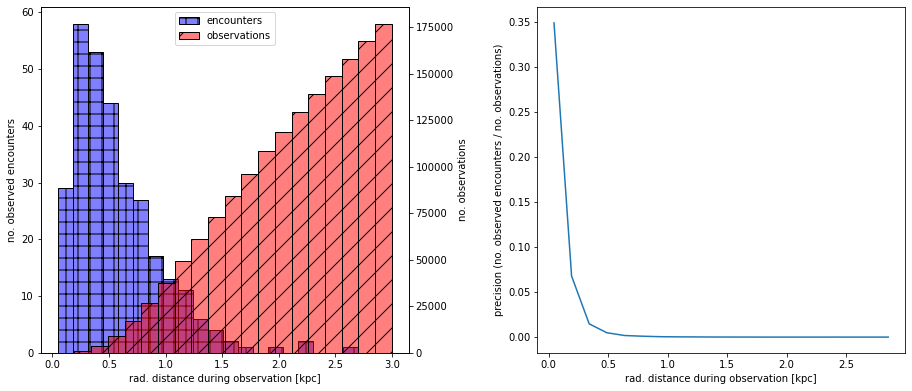

In [19]:
import seaborn as sns

fig, ax = plt.subplots(1,2,figsize=(12,8))

nbins = 20
        
hist1 = sns.histplot(obs_pm_ce['rad'], bins=nbins, alpha=0.5, ax=ax[0],
                     color='blue', hatch='+', label='encounters')
ax[0].set_ylabel('no. observed encounters')
ax[0].set_xlabel('rad. distance during observation [kpc]')
ax2 = ax[0].twinx()
hist2 = sns.histplot(pm_obs['rad'], bins=nbins, alpha=0.5, ax=ax2,
                     color='red', hatch='/', label='observations')
ax2.set_ylabel('no. observations')
handles, labels = ax[0].get_legend_handles_labels()
h, l = ax2.get_legend_handles_labels()
handles.extend(h)
labels.extend(l)
ax[0].legend(handles, labels,loc='upper center')

obs_n, obs_edges = np.histogram(pm_obs['rad'], nbins)
enc_n, enc_edges = np.histogram(obs_pm_ce['rad'], nbins)
histdat = div(enc_n,obs_n)
dens = ax[1].plot(obs_edges[:-1],histdat)
ax[1].set_ylabel('precision (no. observed encounters / no. observations)')
ax[1].set_xlabel('rad. distance during observation [kpc]')
#fig.suptitle("positions of remaining stars after Euclid phot. and prop. motion cut ({} stars)".format(len(euclid_phot_pm)),
#            fontsize=16)
fig.subplots_adjust(0,.2,1,.8,0.35,0)
plt.savefig('hist_obs-enc_1000samp')
plt.show()

In [2]:
# load Euclid and SDSS mock sample
y4 = np.load('/home/oastolk/Galaxia_wrap/output/mock_cat_new/EUCLID_SDSS_GDR3_mock_sample1000_3kpc.npy')

print(len(y4),y4.dtype)

2256393 [('rad', '<f8'), ('teff', '<f8'), ('vx', '<f8'), ('vy', '<f8'), ('vz', '<f8'), ('pz', '<f8'), ('px', '<f8'), ('py', '<f8'), ('feh', '<f8'), ('exbv_schlegel', '<f8'), ('lum', '<f8'), ('glon', '<f8'), ('glat', '<f8'), ('smass', '<f8'), ('age', '<f8'), ('grav', '<f8'), ('gaia_g', '<f8'), ('gaia_bpft', '<f8'), ('gaia_bpbr', '<f8'), ('gaia_rp', '<f8'), ('gaia_rvs', '<f8'), ('euclid_v', '<f8'), ('euclid_y', '<f8'), ('euclid_b', '<f8'), ('euclid_j', '<f8'), ('euclid_r', '<f8'), ('euclid_h', '<f8'), ('sloan_u', '<f8'), ('sloan_g', '<f8'), ('sloan_r', '<f8'), ('sloan_i', '<f8'), ('sloan_z', '<f8'), ('popid', '<i4'), ('mact', '<f8'), ('lma_min_distance', '<f8'), ('total_velocity', '<f8'), ('lma_min_time', '<f8'), ('orbit_min_distance', '<f8'), ('orbit_min_time', '<f8'), ('parallax', '<f8'), ('pmra', '<f8'), ('pmdec', '<f8'), ('radial_velocity', '<f8'), ('ra', '<f8'), ('dec', '<f8')]


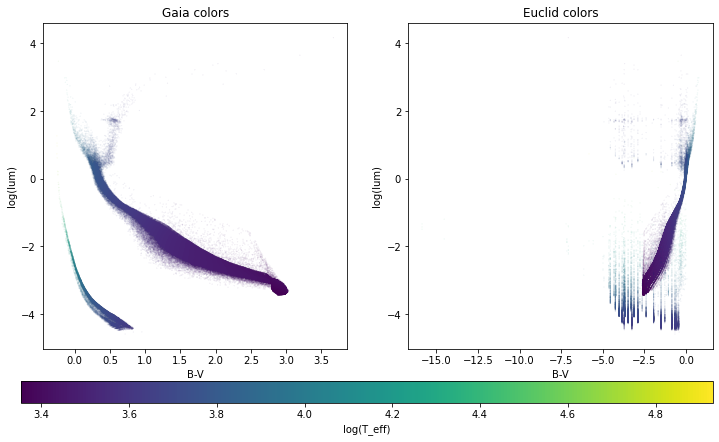

In [25]:
# check stars in HR diagram

fig, ax = plt.subplots(1,2,figsize=(12,6))
gaia = ax[0].scatter(y4['gaia_bpft'][::10]-y4['gaia_g'][::10], y4['lum'][::10],s=0.001,c=y4['teff'][::10])
euclid = ax[1].scatter(y4['euclid_b'][::10]-y4['euclid_v'][::10], y4['lum'][::10],s=0.001,c=y4['teff'][::10])
for idx in [0,1]:
    ax[idx].set_ylabel('log(lum)')
    ax[idx].set_xlabel('B-V')

ax[0].set_title('Gaia colors')
ax[1].set_title('Euclid colors')

c_ax = fig.add_axes([.1,0,.8,.05])
plt.colorbar(gaia,orientation='horizontal',cax=c_ax,label='log(T_eff)')

#plt.savefig('hrdiag_check_euclid-sdss-samp1000')
plt.show()

In [21]:
print(min(y4['euclid_v']),max(y4['euclid_v']))
print(min(y4['euclid_b']),max(y4['euclid_b']))

print(min(y4['gaia_g']),max(y4['gaia_g']))
print(min(y4['gaia_bpft']),max(y4['gaia_bpft']))

-0.8749367924178806 48.93027836525831
-2.5650099051001343 31.119279448632334
3.6036348818261352 28.77562448340277
4.71092445933863 30.701456595246974
